In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import json
from torch.utils.data import DataLoader
import os
from torchvision.utils import save_image

In [2]:
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')

mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])
raw_transforms=transforms.Compose([
     transforms.ToTensor()
])

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 185MB/s]


In [3]:
def load_label_map(json_file):
    """
    Load the label map from a JSON file. The files contains strings with the format "index: class_name".

    Args:
        json_file (str): Path to the JSON file containing the label map.

    Returns:
        dict: A dictionary mapping class indices to class names.
    
    """
    with open(json_file) as f:
        label_map = json.load(f)
    index_to_classname = {}
    for entry in label_map:
        index_str, class_name = entry.split(': ', 1)
        index = int(index_str.strip())
        class_name = class_name.strip()
        index_to_classname[index] = class_name
    return index_to_classname

In [4]:
def evaluate(model, loader, device, image_idx):
    """
    Evaluate the accuracy of the model in predicting the top 1 and
    top 5 most likely labels for images.

    Evaluation is restricted to the 100 classes present in the dataset 
    provided by the dataloader. This may result in higher accuracy 
    compared to evaluating on all 1000 classes.

    Args:
        model (torch.nn.Module): The classifier model to evaluate.
        loader (torch.utils.data.DataLoader): Dataloader providing images and labels.
        device (torch.device): Device to run the evaluation on (e.g., 'cuda' or 'cpu').
        image_idx (dict): Mapping of image index to class index.

    Returns:
        acc1 (float): Top-1 accuracy (percentage of correctly classified images).
        acc5 (float): Top-5 accuracy (percentage of images where the correct label is within the top 5 predictions).
    """
    top1_result = 0
    top5_result = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            mapped_labels = torch.tensor([image_idx[int(l)] for l in labels]).to(device)

            #Output is 1000 logits representing the confidence score for each of the 1000 classes
            outputs = model(images)

            #Only keeping the confidence scores for the 100 included classes in the given folder
            outputs_reduced = outputs[:, 401:501]

            #Finds the top1 and top5 most confident index predictions
            _, top1 = outputs_reduced.topk(1, dim=1)
            _, top5 = outputs_reduced.topk(5, dim=1)

            #Connect indices to the fact that we're using images 401-500
            top1_preds = top1 + 401
            top5_preds = top5 + 401

            top1_result += (top1_preds.squeeze() == mapped_labels).sum().item()
    
            for i in range(mapped_labels.size(0)):
                if mapped_labels[i] in top5_preds[i]:
                    top5_result += 1

            total += mapped_labels.size(0)

    acc1 = top1_result / total * 100
    acc5 = top5_result / total * 100
    
    return acc1, acc5

In [5]:
def print_eval(title, acc1, acc5, baseline_acc1, baseline_acc5):
    print(f"[{title}] Top-1: {acc1:.2f}% | Top-5: {acc5:.2f}%")
    print(f"Compare: Top-1 Drop {baseline_acc1 - acc1:.2f}%")
    print(f"Top-5 Drop {baseline_acc5 - acc5:.2f}%")

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
pretrained_model.to(device)
pretrained_model.eval()
criterion = torch.nn.CrossEntropyLoss()

In [7]:
dataset_path = "/kaggle/input/testdataset/TestDataSet"
json_path = os.path.join(dataset_path, "labels_list.json")
index_to_classname = load_label_map(json_path)
image_idx = {i: int(index) for i, index in enumerate(index_to_classname.keys())}

dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
raw_dataset=torchvision.datasets.ImageFolder(root=dataset_path, transform=raw_transforms)
raw_dataloader=DataLoader(raw_dataset, batch_size=32, shuffle=False)

## Generating Adversarial Image

In [8]:
def generate_adversarial(model, loader, device, epsilon, save_dir, image_idx, mean_norms, std_norms):
    """
    Generate adversarial images via the Fast Gradient Sign Method (FGSM).

    We first normalize each input inside the forward pass to match the model’s
    training distribution. After computing the loss gradient w.r.t. that normalized
    input, we divide by the standard deviation to recover the gradient in raw pixel
    space, then take a single ε‐sized step in its sign direction. Finally, we clamp
    every pixel to [0,1] and save the resulting adversarial images.
    """
    std_tensor = torch.tensor(std_norms).view(1, -1, 1, 1).to(device)
    for idx, (images, labels) in enumerate(loader):
        images = images.to(device)
        # since the model at evaluating (default is "false")
        images.requires_grad = True
        
        #normalize the images
        norm_images = transforms.Normalize(mean=mean_norms.tolist(), std=std_norms.tolist())(images)
        mapped_labels = torch.tensor([image_idx[int(l)] for l in labels]).to(device)
        outputs = model(norm_images)
        loss = criterion(outputs, mapped_labels)

        model.zero_grad()
        loss.backward()

        # (∇xL)
        data_grad = images.grad.data
        #return the images to pixel space
        data_grad = data_grad / std_tensor
        # x<-x+ϵ⋅sign(∇xL)
        adv_images = images + epsilon * data_grad.sign()
        
        # Clamp to [0,1] so the resulting tensor is valid raw‐pixel data
        adv_images = torch.clamp(adv_images, 0, 1)

        for i in range(adv_images.size(0)):
            class_idx = labels[i].item()  # original class index from ImageFolder
            folder_name = f"{class_idx:03d}"
            class_dir = os.path.join(save_dir, folder_name)
            os.makedirs(class_dir, exist_ok=True)

            # Normalize for model, but save raw pixels
            img_to_save = adv_images[i].cpu()
            save_path = os.path.join(class_dir, f"adv_{idx * loader.batch_size + i:03d}.png")
            save_image(img_to_save, save_path)

## Generating Projected Gradient Descent Adversarial

In [15]:
def generate_pgd_adversarial(model, loader, device, epsilon, alpha, num_iter, save_dir, image_idx, mean_norms, std_norms):
    """
    Generate adversarial images via iterative Projected Gradient Descent (PGD).

    At each of T=num_iter steps:
      1. Normalize the current adversarial images to match the model’s expected input.
      2. Compute the loss gradient w.r.t. normalized pixels and rescale by 1/std to obtain
         the gradient in raw [0,1] pixel space.
      3. Take a small FGSM‐style step of size alpha in the sign of that gradient.
      4. Project the result back into the L∞ ball (radius epsilon) around the original image.
      5. Clamp to [0,1] to ensure valid raw‐pixel values.

    After the final iteration, each perturbed image is saved under save_dir in PNG format.
    """
    std_tensor = torch.tensor(std_norms).float().view(1, -1, 1, 1).to(device)
    
    for idx, (images, labels) in enumerate(loader):
        images = images.to(device)
        ori_images = images.clone().detach()
        mapped_labels = torch.tensor([image_idx[int(l)] for l in labels]).to(device)
        # store original image, no gradient, since we going to modify the value of image
        # it is better to detach it (which means make a new copy, and manipulate it,
        # so it will not affect the original image)
        adv_images = images.clone().detach()

        for _ in range(num_iter):
            adv_images.requires_grad = True
            # Normalize for model input
            norm_adv_images = transforms.Normalize(mean=mean_norms.tolist(), std=std_norms.tolist())(adv_images)

            outputs = model(norm_adv_images)
            loss = criterion(outputs, mapped_labels)

            model.zero_grad()
            loss.backward()

            grad = adv_images.grad.data
            grad = grad / std_tensor

            # PGD update in pixel space
            adv_images = adv_images + alpha * grad.sign()

            # Project perturbation back to epsilon-ball around original image
            perturbation = torch.clamp(adv_images - ori_images, min=-epsilon, max=epsilon)
            adv_images = torch.clamp(ori_images + perturbation, min=0, max=1).detach()

        for i in range(adv_images.size(0)):
            class_idx = labels[i].item()
            folder_name = f"{class_idx:03d}"
            class_dir = os.path.join(save_dir, folder_name)
            os.makedirs(class_dir, exist_ok=True)

            img_to_save = adv_images[i].cpu()
            save_path = os.path.join(class_dir, f"adv_pgd_{idx * loader.batch_size + i:03d}.png")
            save_image(img_to_save, save_path)

# Generating Patch PGD Adversarial (non-target and target)

In [16]:
def generate_pgd_patch_adversarial(model, loader, device, epsilon, alpha, num_iter, save_dir, image_idx, mean_norms, std_norms, patch_size=32):
    std_tensor = torch.tensor(std_norms).float().view(1, -1, 1, 1).to(device)
    
    for idx, (images, labels) in enumerate(loader):
        images = images.to(device)
        ori_images = images.clone().detach()
        adv_images = images.clone().detach()

        H, W = images.shape[2], images.shape[3]
        x = np.random.randint(0, H - patch_size + 1)
        y = np.random.randint(0, W - patch_size + 1)

        for _ in range(num_iter):
            adv_images.requires_grad = True
            norm_adv_images = transforms.Normalize(mean=mean_norms.tolist(), std=std_norms.tolist())(adv_images)
            outputs = model(norm_adv_images)
            mapped_labels = torch.tensor([image_idx[int(l)] for l in labels]).to(device)

            loss = criterion(outputs, mapped_labels)
            model.zero_grad()
            loss.backward()

            grad = adv_images.grad.data
            grad = grad / std_tensor

            # Only update the patch area
            grad_patch = grad[:, :, x:x + patch_size, y:y + patch_size]
            adv_patch = adv_images[:, :, x:x + patch_size, y:y + patch_size]

            adv_patch = adv_patch + alpha * grad_patch.sign()

            # Project patch perturbation to epsilon-ball
            perturb_patch = torch.clamp(adv_patch - ori_images[:, :, x:x + patch_size, y:y + patch_size],min=-epsilon, max=epsilon)
            adv_patch = torch.clamp(ori_images[:, :, x:x + patch_size, y:y + patch_size] + perturb_patch,min=0, max=1)

            # Update patch back to adv_images
            adv_images = adv_images.detach()
            adv_images[:, :, x:x + patch_size, y:y + patch_size] = adv_patch.detach()

            # detach adv_images from auto grad
            adv_images = adv_images.detach()
            adv_images[:, :, x:x+patch_size, y:y+patch_size] = adv_patch.detach()

        for i in range(adv_images.size(0)):
            class_idx = labels[i].item()
            folder_name = f"{class_idx:03d}"
            class_dir = os.path.join(save_dir, folder_name)
            os.makedirs(class_dir, exist_ok=True)

            save_path = os.path.join(class_dir, f"adv_patch_{idx * loader.batch_size + i:03d}.png")
            save_image(adv_images[i].cpu(), save_path)

In [17]:
def generate_pgd_patch_targeted_adversarial(
    model, loader, device, epsilon, alpha, num_iter, save_dir,
    image_idx, mean_norms, std_norms, patch_size=32, target_class=401
):
    std_tensor = torch.tensor(std_norms).view(1, -1, 1, 1).to(device)
    
    for idx, (images, labels) in enumerate(loader):
        images = images.to(device)
        ori_images = images.clone().detach()
        adv_images = images.clone().detach()

        H, W = images.shape[2], images.shape[3]
        x = np.random.randint(0, H - patch_size + 1)
        y = np.random.randint(0, W - patch_size + 1)

        # Set all targets to 401 class
        target_labels = torch.full((images.size(0),), target_class, dtype=torch.long).to(device)
        
        for _ in range(num_iter):
            adv_images.requires_grad = True
            norm_adv_images = transforms.Normalize(mean=mean_norms.tolist(), std=std_norms.tolist())(adv_images)
            outputs = model(norm_adv_images)
            # Use target labels to guide attack towards target class
            loss = criterion(outputs, target_labels)

            model.zero_grad()
            loss.backward()

            grad = adv_images.grad.data
            grad = grad / std_tensor
            
            grad_patch = grad[:, :, x:x + patch_size, y:y + patch_size]
            adv_patch = adv_images[:, :, x:x + patch_size, y:y + patch_size]

            # Targeted attack uses NEGATIVE gradient direction
            adv_patch = adv_patch - alpha * grad_patch.sign()

            # Project perturbation back to epsilon-ball in pixel space
            perturb_patch = torch.clamp(
                adv_patch - ori_images[:, :, x:x + patch_size, y:y + patch_size],
                min=-epsilon, max=epsilon
            )
            adv_patch = torch.clamp(
                ori_images[:, :, x:x + patch_size, y:y + patch_size] + perturb_patch,
                min=0, max=1
            )

            adv_images = adv_images.detach()
            adv_images[:, :, x:x + patch_size, y:y + patch_size] = adv_patch.detach()


        for i in range(adv_images.size(0)):
            class_idx = labels[i].item()
            folder_name = f"{class_idx:03d}"
            class_dir = os.path.join(save_dir, folder_name)
            os.makedirs(class_dir, exist_ok=True)

            save_path = os.path.join(class_dir, f"adv_pgd_targeted_{idx * loader.batch_size + i:03d}.png")
            save_image(adv_images, save_path)


## Result for Task 1~4

In [9]:
top1_acc, top5_acc = evaluate(pretrained_model, dataloader, device, image_idx)
print_eval("Original", top1_acc, top5_acc, top1_acc, top5_acc)

[Original] Top-1: 89.60% | Top-5: 99.40%
Compare: Top-1 Drop 0.00%
Top-5 Drop 0.00%


In [10]:
# Task 2: Adversarial
# Generate adversarial image
adversarial_test_save_dir = "./Adversarial_Test_Set_1"
adv_epsilon = .02
generate_adversarial(
    model=pretrained_model,
    loader=raw_dataloader,
    device=device,
    epsilon=adv_epsilon,
    save_dir=adversarial_test_save_dir,
    image_idx=image_idx,
    mean_norms=mean_norms,
    std_norms=std_norms
)
adv_dataset = torchvision.datasets.ImageFolder(root=adversarial_test_save_dir, transform=plain_transforms)
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

# adversarial
adv_top1_acc, adv_top5_acc = evaluate(pretrained_model, adv_loader, device, image_idx)
print_eval("Adversarial", adv_top1_acc, adv_top5_acc, top1_acc, top5_acc)

[Adversarial] Top-1: 20.60% | Top-5: 47.20%
Compare: Top-1 Drop 69.00%
Top-5 Drop 52.20%


In [18]:
# Task 3: pgd adversarial
# Generate pgd adversarial image
pgd_save_dir = "./Adversarial_Test_Set_2"
pgd_epsilon = 0.02
pgd_alpha = 0.003
pgd_num_iter = 30
generate_pgd_adversarial(
    model=pretrained_model,
    loader=raw_dataloader,
    device=device,
    epsilon=pgd_epsilon,
    alpha=pgd_alpha,
    num_iter=pgd_num_iter,
    save_dir=pgd_save_dir,
    image_idx=image_idx,
    mean_norms=mean_norms,
    std_norms=std_norms
)

pgd_adv_dataset = torchvision.datasets.ImageFolder(root=pgd_save_dir, transform=plain_transforms)
pgd_adv_loader = DataLoader(pgd_adv_dataset, batch_size=32, shuffle=False)

# pgd adversarial
pgd_adv_top1_acc, pgd_adv_top5_acc = evaluate(pretrained_model, pgd_adv_loader, device, image_idx)
print_eval("PGD Adversarial", pgd_adv_top1_acc, pgd_adv_top5_acc, top1_acc, top5_acc)

[PGD Adversarial] Top-1: 0.60% | Top-5: 3.40%
Compare: Top-1 Drop 89.00%
Top-5 Drop 96.00%


In [19]:
# Task 4: patch
# Generate patch pgd adversarial image untargeted:
patch_save_dir = "./Adversarial_Test_Set_3"
patch_epsilon = 0.5
patch_alpha = 0.02
patch_num_iter = 25
generate_pgd_patch_adversarial(
    model=pretrained_model,
    loader=raw_dataloader,
    device=device,
    epsilon=patch_epsilon,
    alpha=patch_alpha,
    num_iter=patch_num_iter,
    save_dir=patch_save_dir,
    image_idx=image_idx,
    mean_norms=mean_norms,
    std_norms=std_norms
)

patch_pgd_adv_dataset = torchvision.datasets.ImageFolder(root=patch_save_dir, transform=plain_transforms)
patch_pgd_adv_loader = DataLoader(patch_pgd_adv_dataset, batch_size=32, shuffle=False)

# patch pgd adversarial
patch_pgd_adv_top1_acc, patch_pgd_adv_top5_acc = evaluate(pretrained_model, patch_pgd_adv_loader, device, image_idx)
print_eval("Patch PGD Adversarial", patch_pgd_adv_top1_acc, patch_pgd_adv_top5_acc, top1_acc, top5_acc)

[Patch PGD Adversarial] Top-1: 56.60% | Top-5: 88.40%
Compare: Top-1 Drop 33.00%
Top-5 Drop 11.00%


In [ ]:
# Targeted patch pgd adversarial
generate_pgd_patch_targeted_adversarial(
    model=pretrained_model,
    loader=raw_dataloader,
    device=device,
    epsilon=0.5,
    alpha=0.01,
    num_iter=10,
    save_dir="./Adversarial_Targeted_Patch",
    image_idx=image_idx,
    mean_norms=mean_norms,
    std_norms=std_norms,
    patch_size=32,
    target_class=401  # 
)

target_patch_pgd_adv_dataset = torchvision.datasets.ImageFolder(root="./Adversarial_Targeted_Patch", transform=plain_transforms)
target_patch_pgd_adv_loader = DataLoader(target_patch_pgd_adv_dataset, batch_size=32, shuffle=False)

In [19]:
# Evaluate original
# in this case, we are restrict to indices 401-500 instead 1000 class output
top1_acc, top5_acc = evaluate(pretrained_model, dataloader, device, image_idx)
print_eval("Original", top1_acc, top5_acc, top1_acc, top5_acc)

# adversarial
adv_top1_acc, adv_top5_acc = evaluate(pretrained_model, adv_loader, device, image_idx)
print_eval("Adversarial", adv_top1_acc, adv_top5_acc, top1_acc, top5_acc)

# pgd adversarial
pgd_adv_top1_acc, pgd_adv_top5_acc = evaluate(pretrained_model, pgd_adv_loader, device, image_idx)
print_eval("PGD Adversarial", pgd_adv_top1_acc, pgd_adv_top5_acc, top1_acc, top5_acc)

# patch pgd adversarial
patch_pgd_adv_top1_acc, patch_pgd_adv_top5_acc = evaluate(pretrained_model, patch_pgd_adv_loader, device, image_idx)
print_eval("Patch PGD Adversarial", patch_pgd_adv_top1_acc, patch_pgd_adv_top5_acc, top1_acc, top5_acc)

# # patch pgd adversarial
# target_target_patch_pgd_adv_top1_acc, target_patch_pgd_adv_top5_acc = evaluate(pretrained_model, target_patch_pgd_adv_loader, device, image_idx)
# print_eval("target Patch PGD Adversarial", target_target_patch_pgd_adv_top1_acc, target_patch_pgd_adv_top5_acc, top1_acc, top5_acc)


[Original] Top-1: 89.60% | Top-5: 99.40%
Compare: Top-1 Drop 0.00%
Top-5 Drop 0.00%
[Adversarial] Top-1: 2.00% | Top-5: 9.20%
Compare: Top-1 Drop 87.60%
Top-5 Drop 90.20%
[PGD Adversarial] Top-1: 1.60% | Top-5: 7.80%
Compare: Top-1 Drop 88.00%
Top-5 Drop 91.60%
[Patch PGD Adversarial] Top-1: 9.80% | Top-5: 14.80%
Compare: Top-1 Drop 79.80%
Top-5 Drop 84.60%


## Task 5 Using Densenet 121 model to verify the image

In [19]:
# Using DenseNet-121
torch.cuda.empty_cache()
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.to(device)
new_model.eval()

# Evaluating 
original_acc1, original_acc5 = evaluate(new_model, dataloader, device, image_idx)
torch.cuda.empty_cache()
adv1_acc1, adv1_acc5 = evaluate(new_model, adv_loader, device, image_idx)
torch.cuda.empty_cache()
adv2_acc1, adv2_acc5 = evaluate(new_model, pgd_adv_loader, device, image_idx)
torch.cuda.empty_cache()
adv3_acc1, adv3_acc5 = evaluate(new_model, patch_pgd_adv_loader, device, image_idx)
torch.cuda.empty_cache()
adv4_acc1, adv4_acc5 = evaluate(new_model, target_patch_pgd_adv_loader, device, image_idx)
torch.cuda.empty_cache()


print(f"Original: Top-1 {original_acc1:.2f}%, Top-5 {original_acc5:.2f}%")
print(f"FGSM:     Top-1 {adv1_acc1:.2f}%, Top-5 {adv1_acc5:.2f}%")
print(f"PGD:      Top-1 {adv2_acc1:.2f}%, Top-5 {adv2_acc5:.2f}%")
print(f"Patch:    Top-1 {adv3_acc1:.2f}%, Top-5 {adv3_acc5:.2f}%")
print(f"Target:    Top-1 {adv4_acc1:.2f}%, Top-5 {adv4_acc5:.2f}%")

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 183MB/s]


tensor([[401, 439, 432, 490, 429],
        [401, 481, 446, 482, 432],
        [401, 498, 420, 486, 432],
        [401, 462, 461, 446, 402],
        [482, 401, 485, 477, 420],
        [402, 420, 486, 432, 401],
        [402, 486, 420, 413, 432],
        [402, 420, 462, 473, 426],
        [402, 420, 486, 401, 472],
        [402, 420, 486, 465, 411],
        [403, 484, 405, 437, 442],
        [403, 405, 442, 437, 408],
        [403, 408, 460, 437, 449],
        [403, 408, 484, 405, 460],
        [403, 405, 404, 471, 456],
        [404, 466, 408, 403, 450],
        [404, 403, 405, 466, 484],
        [404, 405, 403, 466, 484],
        [404, 405, 403, 466, 484],
        [404, 403, 405, 466, 484],
        [405, 404, 484, 403, 408],
        [405, 404, 403, 417, 407],
        [405, 404, 450, 417, 473],
        [405, 404, 473, 403, 417],
        [405, 450, 404, 417, 473],
        [406, 497, 442, 498, 483],
        [406, 442, 497, 437, 494],
        [497, 406, 442, 454, 498],
        [497, 406, 4

NameError: name 'adv4_acc1' is not defined

In [12]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import random

def _find_adv_path(adv_root: str, local_label: int, idx: int):
    """
    Try each prefix in turn and return the first existing path:
      adv_root/<local_label>/adv_{idx:03d}.png
      adv_root/<local_label>/adv_pgd_{idx:03d}.png
      adv_root/<local_label>/adv_patch_{idx:03d}.png
    """
    folder_name = f"{local_label:03d}"
    class_dir = os.path.join(adv_root, folder_name)
    for prefix in ("adv", "adv_pgd", "adv_patch"):
        name = f"{prefix}_{idx:03d}.png"
        p = os.path.join(class_dir, name)
        if os.path.exists(p):
            return p
    return None

def visualize_adversarial(
    dataset,             # torchvision.datasets.ImageFolder of originals
    adv_root,            # root of saved adversarial folders
    model,               # pretrained model (.eval())
    plain_transforms,    # ToTensor+Normalize you used
    image_idx,           # {local_label->ImageNet idx}
    index_to_classname,  # {ImageNet idx->human name}
    epsilon=0.02,
    num_examples=5
):
    """
    Verifies L∞ ≤ epsilon, then shows up to num_examples randomly sampled flips,
    restricting predictions to only the 401–500 classes.
    """
    device = next(model.parameters()).device

    # 1) Check L∞ bound
    violated = False
    for idx, (orig_path, local) in enumerate(dataset.imgs):
        adv_path = _find_adv_path(adv_root, local, idx)
        if adv_path is None:
            raise FileNotFoundError(f"No adversarial image for idx={idx}, class={local}")
        o = np.array(Image.open(orig_path).convert('RGB'))/255.0
        a = np.array(Image.open(adv_path).convert('RGB'))/255.0
        if np.max(np.abs(a - o)) > epsilon + 1e-6:
            print(f"L∞ violation at idx={idx}: {np.max(np.abs(a - o)):.4f}")
            violated = True
            break
    print(f"L∞ ≤ {epsilon}? {'NO' if violated else 'YES'}")

    # 2) Collect *all* flips 
    # (model predicted correctly on oringal image but incorrectly on adversarial image)
    all_picks = []
    model.eval()
    
    for idx, (orig_path, local) in enumerate(dataset.imgs):
        true_idx = image_idx[local]  # e.g. 401–500

        # Original prediction over restricted classes 401-500
        # Only keeps images where the model predicted correctly
        x0 = plain_transforms(Image.open(orig_path).convert('RGB'))\
                 .unsqueeze(0).to(device)
        with torch.no_grad():
            logits0 = model(x0)[:, 401:501]
            p0_rel  = logits0.argmax(1).item()
            p0      = p0_rel + 401
        if p0 != true_idx:
            continue

        # Adversarial prediction over restricted classes 401-500
        # Only keeps adversarial images where the mode predicted incorrectly
        adv_path = _find_adv_path(adv_root, local, idx)
        x1 = plain_transforms(Image.open(adv_path).convert('RGB'))\
                 .unsqueeze(0).to(device)
        with torch.no_grad():
            logits1 = model(x1)[:, 401:501]

            #Get the top 5 for the visualization
            _, rel_top5 = logits1.topk(5, dim=1)
            top5_rel  = rel_top5[0].cpu().numpy().astype(int)
            top5      = top5_rel + 401

            #Get the models prediction on the adversarial image
            p1_rel    = logits1.argmax(1).item()
            p1        = p1_rel + 401

            # Get probability distribution over the 100 labels
            # Used to give probabilities for the top 5 in visualization
            probs100  = F.softmax(logits1[0], dim=0).cpu().numpy()

        if p1 == true_idx:
            continue

        # prepare plotting data
        o = np.array(Image.open(orig_path).convert('RGB'))/255.0
        a = np.array(Image.open(adv_path).convert('RGB'))/255.0
        noise = np.clip((a - o)/epsilon/2 + 0.5, 0, 1)

        # The correct label for the picture
        true_name = index_to_classname[true_idx]

        # The models predicted label on the adversarial image
        pred_name = index_to_classname[p1]

        # Top 5 predicted labels on the adversarial image
        top5_names = [index_to_classname[i] for i in top5]

        # Percentage of confidence for the top 5 labels on the adversarial image
        top5_confs = probs100[top5_rel]

        all_picks.append((o, a, noise, true_name, pred_name, top5_names, top5_confs))

    if not all_picks:
        print("No flipped examples found.")
        return

    # ─── Quick sanity checks ─────────────────────────────────────────
    print(f"Total images: {len(dataset.imgs)}")
    print(f"Top-1 flips : {len(all_picks)}")

    # Count how many of those also lose the true label in Top-5:
    full5_failures = []
    for (o, a, noise, true_name, pred_name, top5_names, top5_confs), (orig_path, local) in zip(all_picks, dataset.imgs):
        true_idx = image_idx[local]
        # if the true label is *not* among the top-5 names, it’s a full Top-5 failure
        if true_name not in top5_names:
            full5_failures.append((o, a, noise, true_name, pred_name, top5_names, top5_confs))
    print(f"Full Top-5 failures: {len(full5_failures)}")

    # 3) Randomly sample and plot
    picks = random.sample(all_picks, min(len(all_picks), num_examples))
    n = len(picks)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1:
        axes = axes[np.newaxis, :]

    for i, (o, a, noise, tname, pname, names5, confs5) in enumerate(picks):
        ax0, ax1, ax2, ax3 = axes[i]
        ax0.imshow(o)
        ax0.set_title(f"Original\n{tname}")
        ax0.axis('off')

        ax1.imshow(a)
        ax1.set_title(f"Adversarial\n{pname}")
        ax1.axis('off')

        ax2.imshow(noise)
        ax2.set_title("Noise (scaled)")
        ax2.axis('off')

        ax3.barh(range(5)[::-1], confs5[::-1])
        ax3.set_yticks(range(5))
        ax3.set_yticklabels(names5)
        ax3.set_xlim(0, confs5.max()*1.1)
        ax3.set_xlabel("Confidence")
        ax3.set_title("Top-5 Predictions")

    plt.tight_layout()
    plt.show()

L∞ ≤ 0.02? YES
Total images: 500
Top-1 flips : 345
Full Top-5 failures: 225


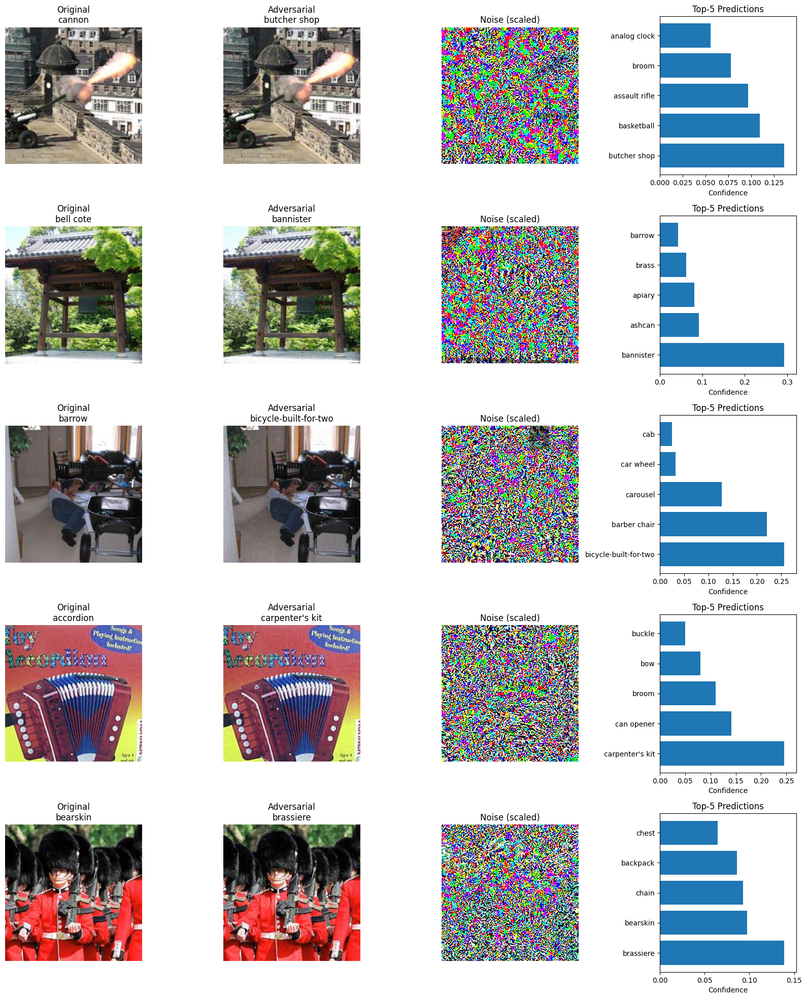

In [14]:
# for adversarial attack
visualize_adversarial(
    dataset=dataset,
    adv_root=adversarial_test_save_dir,
    model=pretrained_model,
    plain_transforms=plain_transforms,
    image_idx=image_idx,
    index_to_classname=index_to_classname,
    epsilon=0.02,
    num_examples=5
)

L∞ ≤ 0.02? YES
Total images: 500
Top-1 flips : 445
Full Top-5 failures: 434


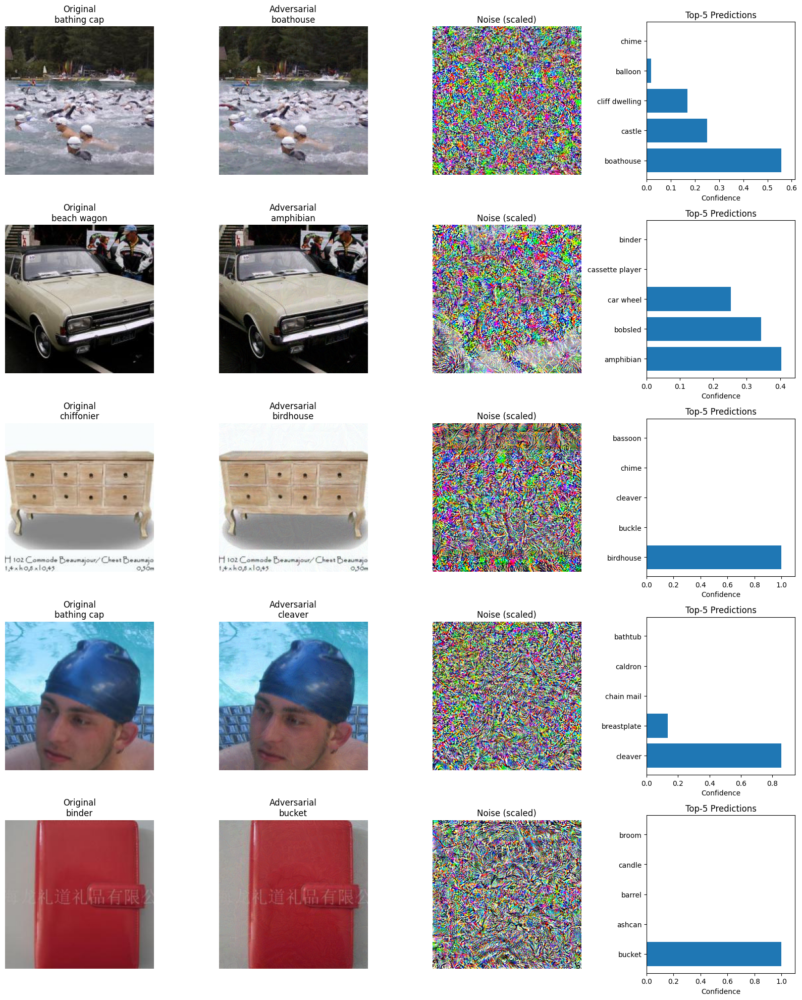

In [20]:
visualize_adversarial(
    dataset=dataset,
    adv_root=pgd_save_dir,
    model=pretrained_model,
    plain_transforms=plain_transforms,
    image_idx=image_idx,
    index_to_classname=index_to_classname,
    epsilon=0.02,
    num_examples=5
)

L∞ violation at idx=34: 0.5020
L∞ ≤ 0.5? NO
Total images: 500
Top-1 flips : 165
Full Top-5 failures: 41


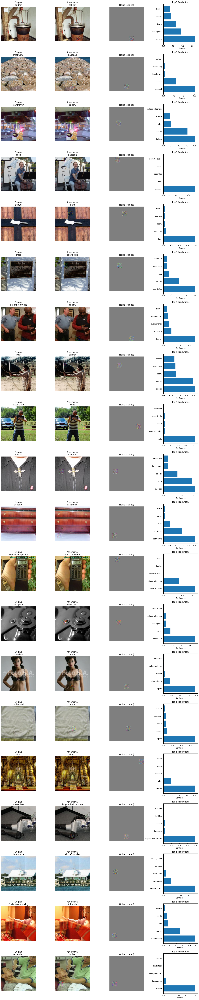

In [21]:
visualize_adversarial(
    dataset=dataset,
    adv_root=patch_save_dir,
    model=pretrained_model,
    plain_transforms=plain_transforms,
    image_idx=image_idx,
    index_to_classname=index_to_classname,
    epsilon=0.5,
    num_examples=20
)

L∞ violation at idx=0: 0.5020
L∞ ≤ 0.5? NO


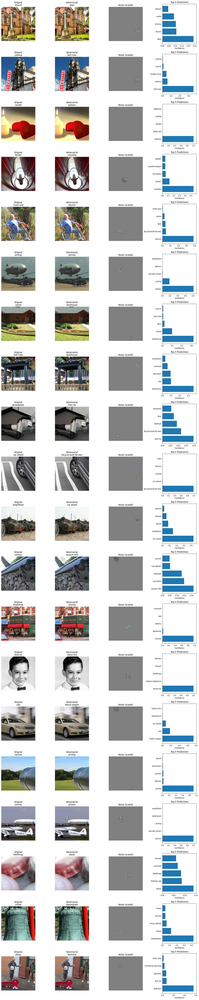

In [38]:
visualize_adversarial(
    dataset=dataset,
    adv_root=patch_save_dir,
    model=pretrained_model,
    plain_transforms=plain_transforms,
    image_idx=image_idx,
    index_to_classname=index_to_classname,
    epsilon=0.5,
    num_examples=20
)